In [1]:
import os
import glob
import time
import sys
import random
import pillow_heif
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm import tqdm
from glob import glob
from PIL import Image, UnidentifiedImageError, ImageOps
from scipy.linalg import sqrtm

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.image import ssim
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input

# CONFIGURATION

In [2]:
class CFG:
    BATCH_SIZE = 1
    IMG_SIZE = 128
    BUFFER_SIZE = 1000

    EPOCHS = 40
    STEPS_PER_EPOCH = 800

    LR_INITIAL = 2e-4
    LR_FINAL = 1e-5
    DISCR_SCALE = 0.25  

    LAMBDA_CYCLE = 10.0
    IDENTITY_WEIGHT = 5.0
    PERC_WEIGHT = 0.2
    RELIGHT_WEIGHT = 0.1

    POOL_SIZE = 50

    USE_R1 = False
    R1_GAMMA = 10.0

    SEED = 42

tf.random.set_seed(CFG.SEED)
np.random.seed(CFG.SEED)
random.seed(CFG.SEED)

# GPU SETUP

In [3]:
strategy = tf.distribute.get_strategy()
num_gpus = len(tf.config.list_physical_devices('GPU'))
print('TensorFlow : ', tf.__version__)
print('Python     : ', sys.version.split()[0])
print("Num GPUs Available : ", num_gpus)

if num_gpus > 0:
    print("✅ GPU")
else:
    print("❌ GPU")

TensorFlow :  2.10.1
Python     :  3.10.18
Num GPUs Available :  1
✅ GPU


In [4]:
try:
    tf.keras.mixed_precision.set_global_policy("float32")
    USE_MIXED = True
except Exception:
    USE_MIXED = False

# LOAD DATASET, PREPROCESS IMAGES & BUILD TF DATASET

In [5]:
day = r"C:\MATTHEW\DATASET\Train\Day"
night = r"C:\MATTHEW\DATASET\Train\Night"

day_dir = r"C:\MATTHEW\DATASET\Train\Resized 128 x 128\Day"
night_dir = r"C:\MATTHEW\DATASET\Train\Resized 128 x 128\Night"

os.makedirs(day_dir, exist_ok=True)
os.makedirs(night_dir, exist_ok=True)

def load_and_preprocess(path):
    img = tf.io.read_file(path)
    img = tf.io.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE))
    img = (tf.cast(img, tf.float32) / 127.5) - 1.0   # [-1,1]
    return img

def make_dataset(folder, batch_size=1, shuffle=True):
    files = tf.io.gfile.glob(os.path.join(folder, "*.jpg"))
    ds = tf.data.Dataset.from_tensor_slices(files)
    if shuffle:
        ds = ds.shuffle(CFG.BUFFER_SIZE, seed=CFG.SEED)
    ds = ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.repeat().batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

def random_augment_pair(a, b):
    flip = tf.random.uniform(()) > 0.5
    a = tf.cond(flip, lambda: tf.image.flip_left_right(a), lambda: a)
    b = tf.cond(flip, lambda: tf.image.flip_left_right(b), lambda: b)
    bright = tf.random.uniform(()) > 0.5
    a = tf.cond(bright, lambda: tf.image.random_brightness(a, 0.1), lambda: a)
    cont = tf.random.uniform(()) > 0.5
    a = tf.cond(cont, lambda: tf.image.random_contrast(a, 0.9, 1.1), lambda: a)
    return a, b

Day_ds = make_dataset(day_dir, batch_size=CFG.BATCH_SIZE, shuffle=True)
Night_ds = make_dataset(night_dir, batch_size=CFG.BATCH_SIZE, shuffle=True)
Train = tf.data.Dataset.zip((Day_ds, Night_ds))

# DATA PREPROCESSING

## SHOW IMAGE

In [10]:
def show_image(input_dir, title=""):
    file_list = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))][:40]
    plt.figure(figsize=(20, 4))
    for i, file_name in enumerate(file_list):
        img_path = os.path.join(input_dir, file_name)
        with Image.open(img_path) as img:
            plt.subplot(4, 10, i + 1)
            plt.imshow(img)
            plt.axis('off')
    plt.suptitle(title)
    plt.show()

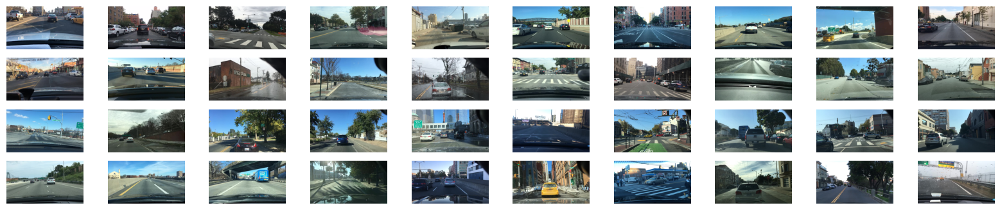

In [11]:
show_image(day)

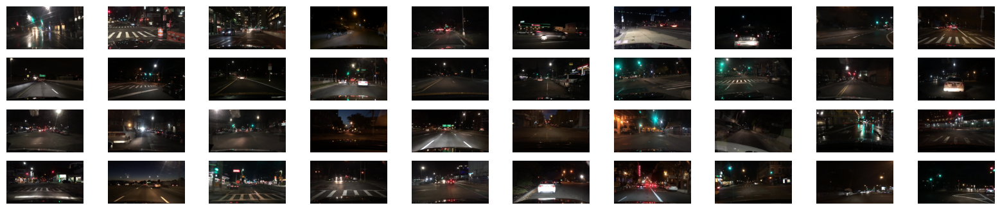

In [12]:
show_image(night)

## IMAGE SIZE

In [ ]:
day_sample = os.path.join(day, os.listdir(day)[7])
night_sample = os.path.join(night, os.listdir(night)[2])

def visualize_image(image_path):
    img = Image.open(image_path).convert("RGB")
    img_np = np.array(img)
    height, width = img_np.shape[:2]
    aspect_ratio = width / height
    fig_width = 8 * aspect_ratio
    fig_height = 8

    plt.figure(figsize=(fig_width, fig_height))
    plt.subplot(1, 1, 1)
    plt.imshow(img_np)
    plt.title(f"{width} x {height} x 3 image")
    plt.xlabel("Width (px)")
    plt.ylabel("Height (px)")

    plt.xticks(np.linspace(0, width, num=5, dtype=int))
    plt.yticks(np.linspace(0, height, num=5, dtype=int))
    plt.grid(True, linestyle="--", linewidth=0.5, color="white", alpha=0.7)

    plt.tight_layout()
    plt.show()

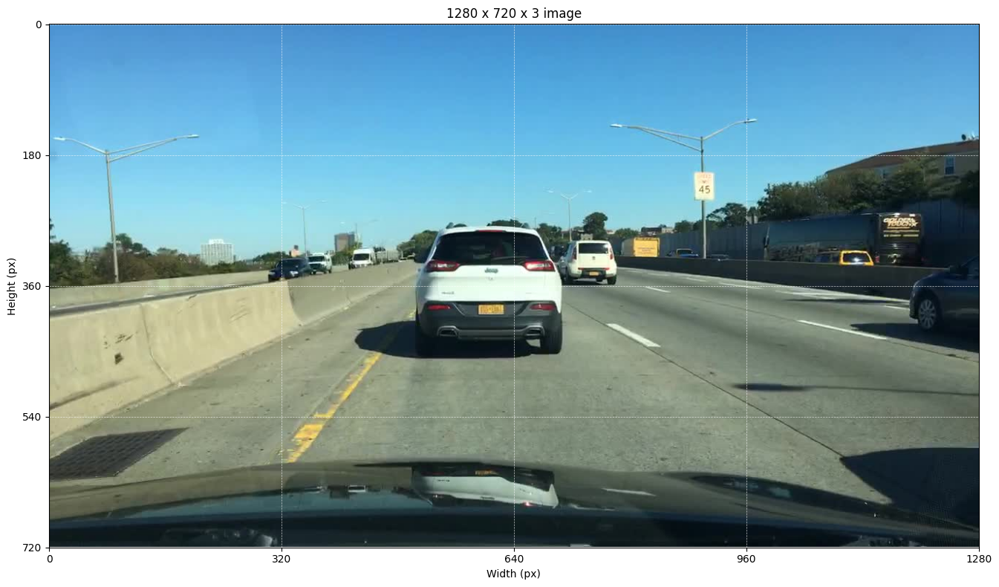

In [14]:
visualize_image(day_sample)

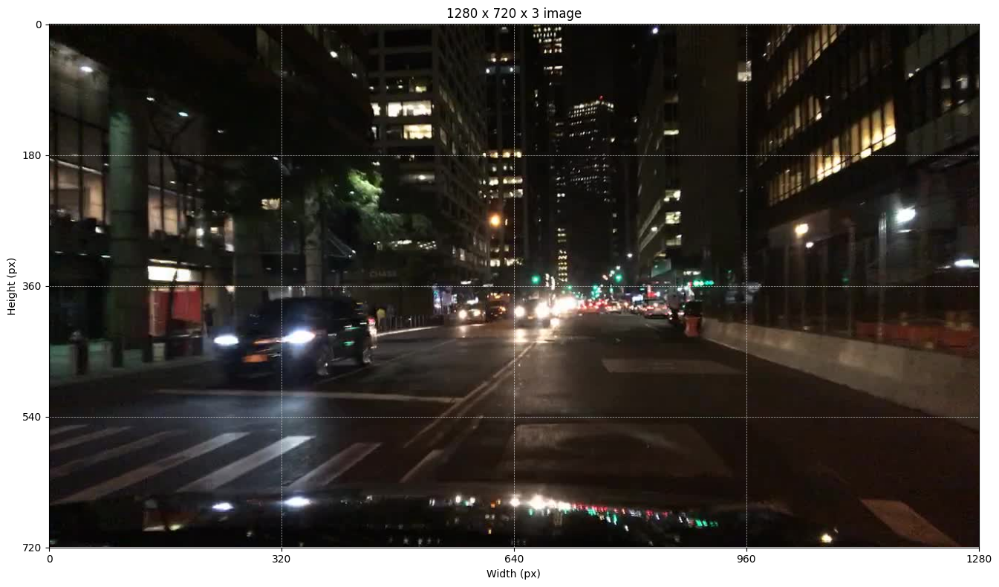

In [15]:
visualize_image(night_sample)

## IMAGE RESIZE

In [6]:
def resize_images(input_dir, output_dir, size=(224, 224)):
    files = [f for f in os.listdir(input_dir)
             if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    print(f"Resize dari folder: {input_dir}")
    print(f"Total file ditemukan: {len(files)}")

    for f in files:
        in_path = os.path.join(input_dir, f)
        out_path = os.path.join(output_dir, f)

        try:
            img = Image.open(in_path).convert("RGB")
            img = img.resize(size, Image.BILINEAR)
            img.save(out_path)
        except Exception as e:
            print(f"Gagal resize {f}: {e}")

resize_images(day, day_dir)
resize_images(night, night_dir)

Resize dari folder: C:\MATTHEW\DATASET\Train\Day
Total file ditemukan: 5000
Resize dari folder: C:\MATTHEW\DATASET\Train\Night
Total file ditemukan: 5000


In [6]:
def show_images(input_dir, title=""):
    file_list = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))][:20]
    plt.figure(figsize=(20, 5))
    for i, file_name in enumerate(file_list):
        img_path = os.path.join(input_dir, file_name)
        with Image.open(img_path) as img:
            plt.subplot(2, 10, i + 1)
            plt.imshow(img)
            plt.axis('off')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

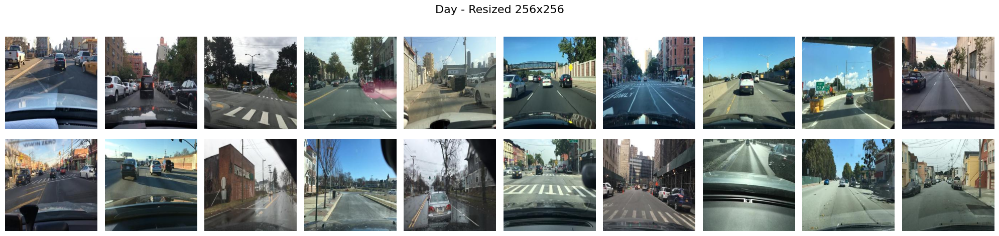

In [7]:
show_images(day_dir, title="Day - Resized 256x256")

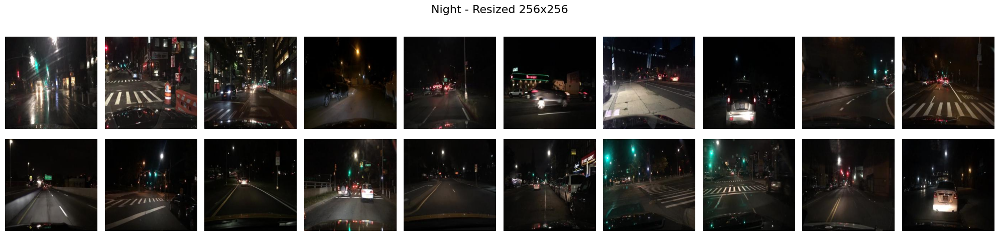

In [8]:
show_images(night_dir, title="Night - Resized 256x256")

## AVERAGE IMAGE SIZE

In [9]:
day_files = [f for f in os.listdir(day_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))]
night_files = [f for f in os.listdir(night_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))]

print(f"Total Day images   : {len(day_files)}")
print(f"Total Night images : {len(night_files)}")

sizes = []
for path in [day_dir, night_dir]:
    for f in os.listdir(path)[:50]:
        with Image.open(os.path.join(path, f)) as img:
            sizes.append(img.size)

sizes_df = pd.DataFrame(sizes, columns=["width", "height"])
print("\nAverage image size :")
print(sizes_df.describe())

Total Day images   : 5000
Total Night images : 5000

Average image size :
       width  height
count  100.0   100.0
mean   256.0   256.0
std      0.0     0.0
min    256.0   256.0
25%    256.0   256.0
50%    256.0   256.0
75%    256.0   256.0
max    256.0   256.0


# EXPLORATORY DATA ANALYSIS (EDA)

## IMAGE SIZE

In [ ]:
def visualize_image_with_rgb(image_path):
    img = Image.open(image_path).convert("RGB").resize((256, 256))
    img_np = np.array(img)

    plt.figure(figsize=(8, 6))
    plt.subplot(2, 2, 1)
    plt.imshow(img_np)
    plt.title("256 x 256 x 3 image")
    plt.xlabel("Width (px)")
    plt.ylabel("Height (px)")

    plt.xticks(np.arange(0, 257, 64))
    plt.yticks(np.arange(0, 257, 64))

    plt.grid(True, linestyle="--", linewidth=0.4,color="white", alpha=0.6)

    plt.tight_layout()
    plt.show()

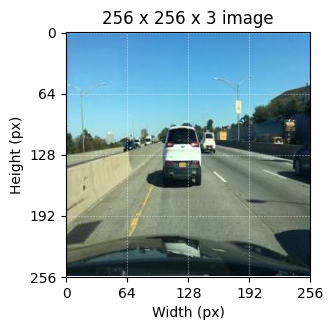

In [14]:
visualize_image_with_rgb(day_sample_Resized)

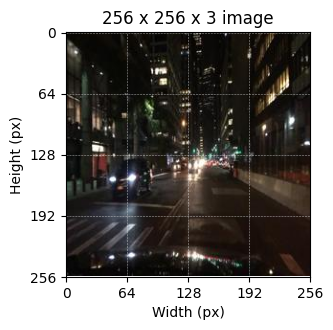

In [15]:
visualize_image_with_rgb(night_sample_Resized)

# NUMBER OF DATASETS

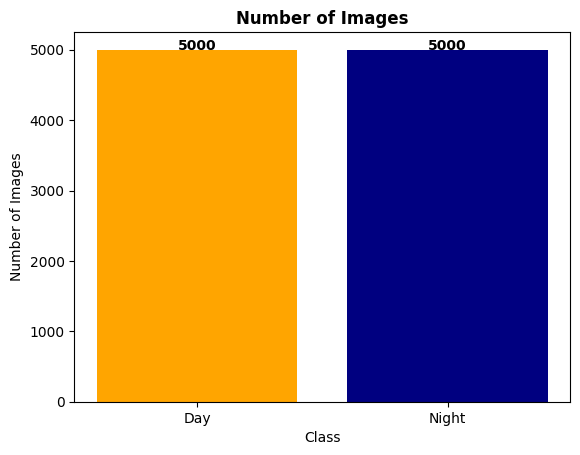

In [32]:
num_day = len([f for f in os.listdir(day_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))])
num_night = len([f for f in os.listdir(night_dir) if f.lower().endswith(('jpg', 'jpeg', 'png'))])

labels = ["Day", "Night"]
values = [num_day, num_night]
colors = ["orange", "navy"]

plt.bar(labels, values, color=colors)

for i, v in enumerate(values):
    plt.text(i, v + 2, str(v), ha='center', fontweight='bold', fontsize=10, color='black')

plt.title("Number of Images", fontsize=12, fontweight='bold')
plt.ylabel("Number of Images")
plt.xlabel("Class")
plt.show()

## RGB DISTRIBUTION

In [33]:
def visualize_RGB(image_path, title):
    img = np.array(Image.open(image_path).convert('RGB'))
    img = (img / 255.0)

    colors = ['red', 'green', 'blue']
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 4, 1)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")

    for i, color in enumerate(colors):
        plt.subplot(1, 4, i + 2)
        plt.hist((img[:, :, i] * 255).flatten(), bins=50, color=color, alpha=0.7)
        plt.title(f"{color.capitalize()} Channel")

    plt.tight_layout()
    plt.show()

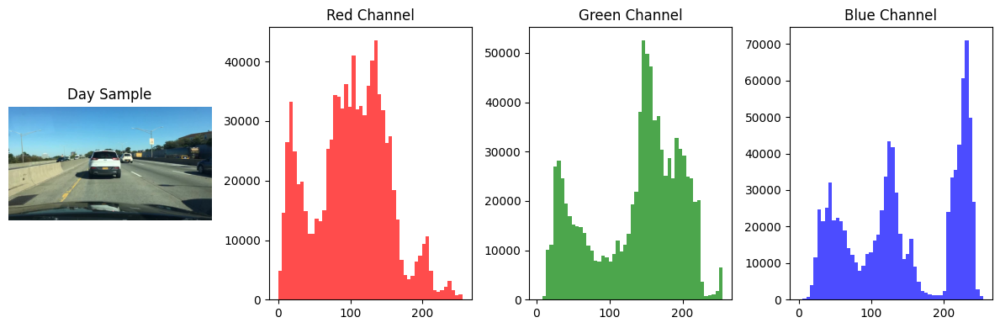

In [34]:
visualize_RGB(day_sample, "Day Sample")

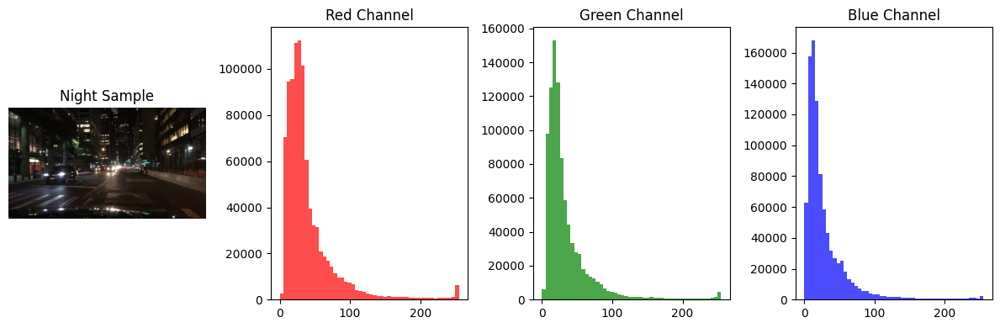

In [35]:
visualize_RGB(night_sample, "Night Sample")

## RGB CHANNEL MEAN DISTRIBUTION

In [36]:
def get_rgb_means(directory):
    means = []
    for f in os.listdir(directory)[:100]:
        with Image.open(os.path.join(directory, f)) as img:
            arr = np.array(img)
            means.append(arr.mean(axis=(0,1)))
    return np.array(means)

day_rgb = get_rgb_means(day_dir)
night_rgb = get_rgb_means(night_dir)

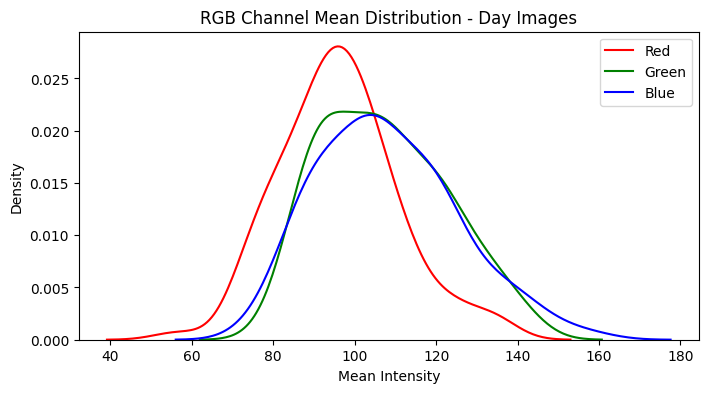

In [37]:
plt.figure(figsize=(8,4))
sns.kdeplot(day_rgb[:,0], label='Red', color='r')
sns.kdeplot(day_rgb[:,1], label='Green', color='g')
sns.kdeplot(day_rgb[:,2], label='Blue', color='b')
plt.title("RGB Channel Mean Distribution - Day Images")
plt.xlabel("Mean Intensity")
plt.ylabel("Density")
plt.legend()
plt.show()

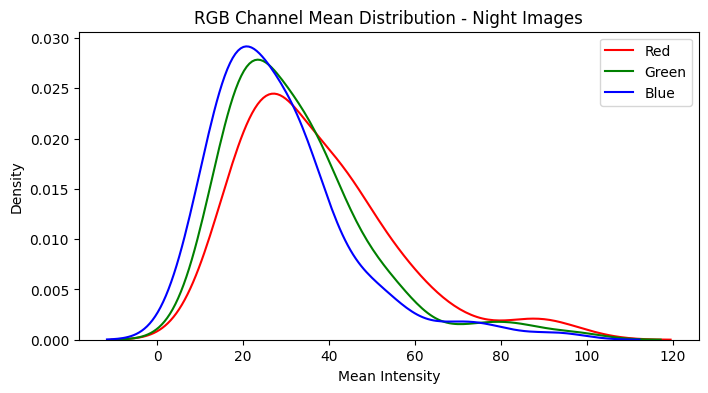

In [38]:
plt.figure(figsize=(8,4))
sns.kdeplot(night_rgb[:,0], label='Red', color='r')
sns.kdeplot(night_rgb[:,1], label='Green', color='g')
sns.kdeplot(night_rgb[:,2], label='Blue', color='b')
plt.title("RGB Channel Mean Distribution - Night Images")
plt.xlabel("Mean Intensity")
plt.ylabel("Density")
plt.legend()
plt.show()

## BRIGHTNESS DISTRIBUTION

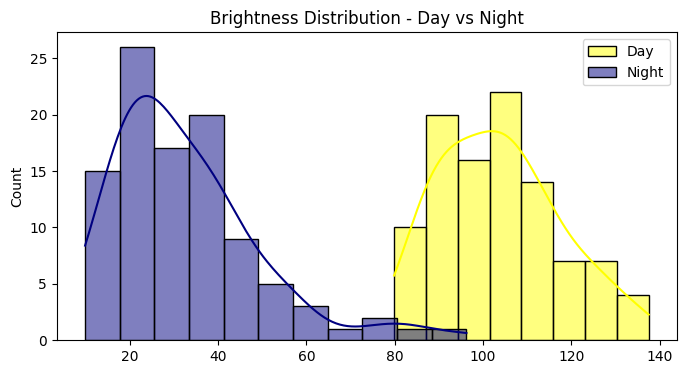

In [ ]:
def brightness(img_array):
    return np.mean(img_array)

day_brightness = [brightness(np.array(Image.open(os.path.join(day_dir, f))))
    for f in day_files[:100]
]
night_brightness = [brightness(np.array(Image.open(os.path.join(night_dir, f))))
    for f in night_files[:100]
]

plt.figure(figsize=(8,4))
sns.histplot(day_brightness, color='yellow', label='Day', kde=True)
sns.histplot(night_brightness, color='navy', label='Night', kde=True)
plt.title("Brightness Distribution - Day vs Night")
plt.legend()
plt.show()

## COLOR CHANNEL CORRELATION

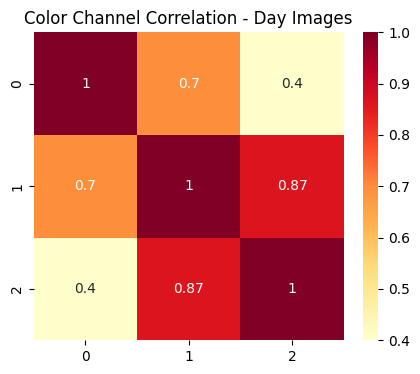

In [40]:
corr_day = np.corrcoef(day_rgb.T)
corr_night = np.corrcoef(night_rgb.T)

plt.figure(figsize=(5,4))
sns.heatmap(corr_day, annot=True, cmap='YlOrRd')
plt.title("Color Channel Correlation - Day Images")
plt.show()

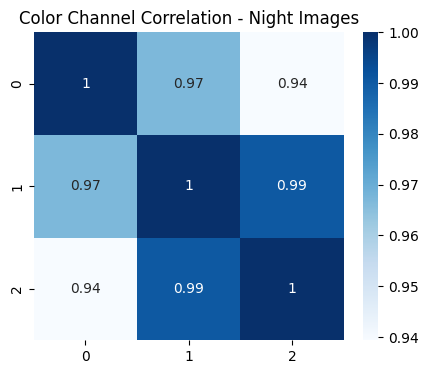

In [41]:
plt.figure(figsize=(5,4))
sns.heatmap(corr_night, annot=True, cmap='Blues')
plt.title("Color Channel Correlation - Night Images")
plt.show()

# IMAGE POOL

In [6]:
class ImagePool:
    def __init__(self, size=50):
        self.size = size
        self.images = []

    def query(self, image):
        if self.size <= 0:
            return image
        if len(self.images) < self.size:
            self.images.append(image)
            return image
        if random.random() > 0.5:
            idx = random.randint(0, self.size - 1)
            tmp = self.images[idx]
            self.images[idx] = image
            return tmp
        return image

In [7]:
vgg = VGG19(include_top=False, weights="imagenet")
vgg.trainable = False
feat_extractor = tf.keras.Model(inputs=vgg.input, outputs=vgg.get_layer("block3_conv3").output)

def preprocess_for_vgg(x):
    x255 = (x + 1.0) * 127.5
    x_resized = tf.image.resize(x255, (128, 128))
    return preprocess_input(x_resized)

def perceptual_loss(real, fake):
    r = preprocess_for_vgg(real)
    f = preprocess_for_vgg(fake)
    r_feat = feat_extractor(r)
    f_feat = feat_extractor(f)
    return tf.reduce_mean(tf.abs(r_feat - f_feat))

def relighting_loss(real, fake):
    real_lum = tf.reduce_mean(real, axis=[1,2,3])
    fake_lum = tf.reduce_mean(fake, axis=[1,2,3])
    return tf.reduce_mean(tf.abs(real_lum - fake_lum))

# REFELECTION PADDING 

In [8]:
class ReflectionPadding2D(tf.keras.layers.Layer):
    def __init__(self, padding=(1,1), **kwargs):
        super().__init__(**kwargs)
        self.padding = padding
    def call(self, x):
        p_h, p_w = self.padding
        return tf.pad(x, [[0,0],[p_h,p_h],[p_w,p_w],[0,0]], mode="REFLECT")

# RESIDUAL BLOCK

In [9]:
initializer = tf.random_normal_initializer(0., 0.02)

def resblock(x, filters):
    y = ReflectionPadding2D((1,1))(x)
    y = tf.keras.layers.Conv2D(filters, 3, padding="valid", use_bias=False, kernel_initializer=initializer)(y)
    y = tfa.layers.InstanceNormalization()(y)
    y = tf.keras.layers.ReLU()(y)

    y = ReflectionPadding2D((1,1))(y)
    y = tf.keras.layers.Conv2D(filters, 3, padding="valid", use_bias=False, kernel_initializer=initializer)(y)
    y = tfa.layers.InstanceNormalization()(y)
    return tf.keras.layers.Add()([x, y])

# BUILD GENERATOR

In [37]:
def build_generator(): 
    inputs = tf.keras.Input(shape=(CFG.IMG_SIZE, CFG.IMG_SIZE, 3))
    x = ReflectionPadding2D((3,3))(inputs)
    x = tf.keras.layers.Conv2D(64, 7, padding="valid", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    x = tf.keras.layers.Conv2D(128, 3, strides=2, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    x = tf.keras.layers.Conv2D(256, 3, strides=2, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.ReLU()(x)
    
    for _ in range(9):
        x = resblock(x, 256)

    x = tf.keras.layers.UpSampling2D(size=2, interpolation="bilinear")(x)
    x = tf.keras.layers.Conv2D(128, 3, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    x = tf.keras.layers.UpSampling2D(size=2, interpolation="bilinear")(x)
    x = tf.keras.layers.Conv2D(64, 3, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.ReLU()(x)

    x = ReflectionPadding2D((3,3))(x)
    out = tf.keras.layers.Conv2D(3, 7, padding="valid", activation="tanh", kernel_initializer=initializer)(x)
    return tf.keras.Model(inputs=inputs, outputs=out, name="ResNet6_G_MEDIUM")

# BUILD DISCRIMINATOR

In [38]:
def build_discriminator():
    inp = tf.keras.Input(shape=(CFG.IMG_SIZE, CFG.IMG_SIZE, 3))
    x = tf.keras.layers.Conv2D(64, 4, strides=2, padding="same", kernel_initializer=initializer)(inp)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    x = tf.keras.layers.Conv2D(128, 4, strides=2, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    x = tf.keras.layers.Conv2D(256, 4, strides=2, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    x = tf.keras.layers.Conv2D(256, 4, strides=1, padding="same", use_bias=False, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    out = tf.keras.layers.Conv2D(1, 4, strides=1, padding="same", kernel_initializer=initializer)(x)
    return tf.keras.Model(inputs=inp, outputs=out, name="PatchDiscriminator")

# MODEL SUMMARY GENERATOR

In [39]:
generator = build_generator()
generator.summary()

Model: "ResNet6_G_MEDIUM"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 reflection_padding2d_42 (Refle  (None, 134, 134, 3)  0          ['input_12[0][0]']               
 ctionPadding2D)                                                                                  
                                                                                                  
 conv2d_445 (Conv2D)            (None, 128, 128, 64  9408        ['reflection_padding2d_42[0][0]']
                                )                                                  

# LAYER GENERATOR

In [40]:
for i, layer in enumerate(generator.layers):
    print(
        f"{i:03d} | {layer.name:30s} "
        f"| shape : {layer.output_shape} "
        f"| params : {layer.count_params()}"
    )

000 | input_12                       | shape : [(None, 128, 128, 3)] | params : 0
001 | reflection_padding2d_42        | shape : (None, 134, 134, 3) | params : 0
002 | conv2d_445                     | shape : (None, 128, 128, 64) | params : 9408
003 | instance_normalization_60      | shape : (None, 128, 128, 64) | params : 128
004 | re_lu_33                       | shape : (None, 128, 128, 64) | params : 0
005 | conv2d_446                     | shape : (None, 64, 64, 128) | params : 73728
006 | instance_normalization_61      | shape : (None, 64, 64, 128) | params : 256
007 | re_lu_34                       | shape : (None, 64, 64, 128) | params : 0
008 | conv2d_447                     | shape : (None, 32, 32, 256) | params : 294912
009 | instance_normalization_62      | shape : (None, 32, 32, 256) | params : 512
010 | re_lu_35                       | shape : (None, 32, 32, 256) | params : 0
011 | reflection_padding2d_43        | shape : (None, 34, 34, 256) | params : 0
012 | conv2d_448 

# MODEL SUMMARY DISCRIMINATOR

In [14]:
discriminator = build_discriminator()
discriminator.summary()

Model: "PatchDiscriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d_18 (Conv2D)          (None, 64, 64, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64, 64, 64)        0         
                                                                 
 conv2d_19 (Conv2D)          (None, 32, 32, 128)       131072    
                                                                 
 instance_normalization_17 (  (None, 32, 32, 128)      256       
 InstanceNormalization)                                          
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 32, 32, 128)       0         
                                                

# LAYER DISCRIMINATOR

In [15]:
for i, layer in enumerate(discriminator.layers):
    print(
        f"{i:03d} | {layer.name:30s} "
        f"| shape : {layer.output_shape} "
        f"| params : {layer.count_params()}"
    )

000 | input_3                        | shape : [(None, 128, 128, 3)] | params : 0
001 | conv2d_18                      | shape : (None, 64, 64, 64) | params : 3136
002 | leaky_re_lu                    | shape : (None, 64, 64, 64) | params : 0
003 | conv2d_19                      | shape : (None, 32, 32, 128) | params : 131072
004 | instance_normalization_17      | shape : (None, 32, 32, 128) | params : 256
005 | leaky_re_lu_1                  | shape : (None, 32, 32, 128) | params : 0
006 | conv2d_20                      | shape : (None, 16, 16, 256) | params : 524288
007 | instance_normalization_18      | shape : (None, 16, 16, 256) | params : 512
008 | leaky_re_lu_2                  | shape : (None, 16, 16, 256) | params : 0
009 | conv2d_21                      | shape : (None, 16, 16, 256) | params : 1048576
010 | instance_normalization_19      | shape : (None, 16, 16, 256) | params : 512
011 | leaky_re_lu_3                  | shape : (None, 16, 16, 256) | params : 0
012 | conv2d_22

# LOSS FUNCTIONS

In [16]:
mse = tf.keras.losses.MeanSquaredError()

def gen_gan_loss(fake):
    return mse(tf.ones_like(fake), fake)

def disc_gan_loss(real, fake):
    return 0.5 * (mse(tf.ones_like(real), real) + mse(tf.zeros_like(fake), fake))

def cycle_loss(real, cycled):
    return CFG.LAMBDA_CYCLE * tf.reduce_mean(tf.abs(real - cycled))

def identity_loss(real, same):
    return CFG.IDENTITY_WEIGHT * tf.reduce_mean(tf.abs(real - same))

# CYCLE GAN MODEL

In [17]:
class CycleGAN(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.Gd2n = build_generator()  # day -> night
        self.Gn2d = build_generator()  # night -> day
        self.Dn = build_discriminator()
        self.Dd = build_discriminator()
        self.pool_n = ImagePool(CFG.POOL_SIZE)
        self.pool_d = ImagePool(CFG.POOL_SIZE)

    def compile(self, g_optimizer, d_optimizer):
        super().compile()
        self.g_opt = g_optimizer
        self.d_opt = d_optimizer

    def train_step(self, batch):
        # batch expected: (day_batch, night_batch)
        day, night = batch

        # optional augment
        day_aug, night_aug = random_augment_pair(day, night)

        with tf.GradientTape(persistent=True) as tape:
            # generators
            fake_n = self.Gd2n(day_aug, training=True)
            fake_d = self.Gn2d(night_aug, training=True)

            cycled_d = self.Gn2d(fake_n, training=True)
            cycled_n = self.Gd2n(fake_d, training=True)

            same_d = self.Gn2d(day_aug, training=True)
            same_n = self.Gd2n(night_aug, training=True)

            # discriminators (use pool for training stability; but compute D forward on actual tensors)
            dn_real = self.Dn(night_aug, training=True)
            dn_fake_pred = self.Dn(self.pool_n.query(tf.stop_gradient(fake_n)), training=True)

            dd_real = self.Dd(day_aug, training=True)
            dd_fake_pred = self.Dd(self.pool_d.query(tf.stop_gradient(fake_d)), training=True)

            # generator adversarial loss (use fresh fake for G update)
            g_loss_d2n = gen_gan_loss(self.Dn(fake_n))
            g_loss_n2d = gen_gan_loss(self.Dd(fake_d))

            # cycle + identity
            cycA = cycle_loss(day_aug, cycled_d)
            cycB = cycle_loss(night_aug, cycled_n)
            idL = identity_loss(day_aug, same_d) + identity_loss(night_aug, same_n)

            # perceptual & relight
            p_loss = perceptual_loss(day_aug, fake_d) + perceptual_loss(night_aug, fake_n)
            r_loss = relighting_loss(day_aug, fake_d) + relighting_loss(night_aug, fake_n)

            total_g = (g_loss_d2n + g_loss_n2d + cycA + cycB + idL
                       + CFG.PERC_WEIGHT * p_loss + CFG.RELIGHT_WEIGHT * r_loss)

            # discriminator losses (LSGAN)
            d_loss_n = disc_gan_loss(dn_real, dn_fake_pred)
            d_loss_d = disc_gan_loss(dd_real, dd_fake_pred)

            # R1 regularization (optional)
            if CFG.USE_R1:
                dn_real_sum = tf.reduce_sum(dn_real)
                dd_real_sum = tf.reduce_sum(dd_real)
        # end tape

        # compute R1 grads outside inner tape if requested
        if CFG.USE_R1:
            grad_dn_real = tape.gradient(dn_real_sum, night_aug)
            grad_dd_real = tape.gradient(dd_real_sum, day_aug)
            r1_n = 0.0 if grad_dn_real is None else tf.reduce_mean(tf.square(grad_dn_real))
            r1_d = 0.0 if grad_dd_real is None else tf.reduce_mean(tf.square(grad_dd_real))
            r1_term_n = 0.5 * CFG.R1_GAMMA * r1_n
            r1_term_d = 0.5 * CFG.R1_GAMMA * r1_d
            d_loss_n = d_loss_n + r1_term_n
            d_loss_d = d_loss_d + r1_term_d

        total_d = d_loss_n + d_loss_d

        # grads
        g_vars = self.Gd2n.trainable_variables + self.Gn2d.trainable_variables
        d_vars = self.Dn.trainable_variables + self.Dd.trainable_variables

        g_grads = tape.gradient(total_g, g_vars)
        d_grads = tape.gradient(total_d, d_vars)

        # defensive: replace None grads with zeros
        d_grads = [g if g is not None else tf.zeros_like(v) for g, v in zip(d_grads, d_vars)]
        g_grads = [g if g is not None else tf.zeros_like(v) for g, v in zip(g_grads, g_vars)]

        # apply
        self.g_opt.apply_gradients(zip(g_grads, g_vars))
        self.d_opt.apply_gradients(zip(d_grads, d_vars))

        del tape

        # metrics
        return {
            "g_loss": total_g,
            "d_loss": total_d,
            "cycle_A": cycA,
            "cycle_B": cycB,
            "identity": idL,
            "perc_loss": p_loss,
            "relight_loss": r_loss,
            "grad_g": tf.linalg.global_norm(g_grads),
            "grad_d": tf.linalg.global_norm(d_grads),
        }

# CALLBACK HISTORY

In [18]:
class LossHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.g_losses = []
        self.d_losses = []
        self.cycle_A = []
        self.cycle_B = []
        self.identity = []
        self.perc_loss = []
        self.relight_loss = []
        self.grad_g = []
        self.grad_d = []

    def on_epoch_end(self, epoch, logs=None):
        self.g_losses.append(logs.get("g_loss"))
        self.d_losses.append(logs.get("d_loss"))
        self.cycle_A.append(logs.get("cycle_A"))
        self.cycle_B.append(logs.get("cycle_B"))
        self.identity.append(logs.get("identity"))
        self.perc_loss.append(logs.get("perc_loss"))
        self.relight_loss.append(logs.get("relight_loss"))
        self.grad_g.append(logs.get("grad_g"))
        self.grad_d.append(logs.get("grad_d"))
        print(f"[Epoch {epoch+1}] g={logs.get('g_loss'):.4f} d={logs.get('d_loss'):.4f} cycA={logs.get('cycle_A'):.4f}")

# TRAINING SETUP

In [19]:
def linear_decay_gen(epoch):
    if epoch < CFG.EPOCHS // 2:
        return float(CFG.LR_INITIAL)
    else:
        t = (epoch - CFG.EPOCHS//2) / float(CFG.EPOCHS//2)
        return float(CFG.LR_INITIAL + t * (CFG.LR_FINAL - CFG.LR_INITIAL))

class DualLRScheduler(tf.keras.callbacks.Callback):
    def __init__(self, discr_scale=CFG.DISCR_SCALE):
        super().__init__()
        self.discr_scale = discr_scale
    def on_epoch_begin(self, epoch, logs=None):
        new_lr_gen = linear_decay_gen(epoch)
        new_lr_disc = new_lr_gen * self.discr_scale
        try:
            self.model.g_opt.learning_rate.assign(new_lr_gen)
        except Exception:
            tf.keras.backend.set_value(self.model.g_opt.learning_rate, new_lr_gen)
        try:
            self.model.d_opt.learning_rate.assign(new_lr_disc)
        except Exception:
            tf.keras.backend.set_value(self.model.d_opt.learning_rate, new_lr_disc)
        print(f"[LR] epoch {epoch+1}: gen={new_lr_gen:.2e} disc={new_lr_disc:.2e}")

In [20]:
gan = CycleGAN()
g_opt = tf.keras.optimizers.Adam(CFG.LR_INITIAL, beta_1=0.5)
d_opt = tf.keras.optimizers.Adam(CFG.LR_INITIAL * CFG.DISCR_SCALE, beta_1=0.5)
gan.compile(g_opt, d_opt)

_ = gan.Gd2n(tf.zeros([1, CFG.IMG_SIZE, CFG.IMG_SIZE, 3]))
_ = gan.Gn2d(tf.zeros([1, CFG.IMG_SIZE, CFG.IMG_SIZE, 3]))
_ = gan.Dn(tf.zeros([1, CFG.IMG_SIZE, CFG.IMG_SIZE, 3]))
_ = gan.Dd(tf.zeros([1, CFG.IMG_SIZE, CFG.IMG_SIZE, 3]))

loss_hist = LossHistory()
lr_cb = DualLRScheduler(discr_scale=CFG.DISCR_SCALE)

start = time.time()
gan.fit(Train, epochs=CFG.EPOCHS, steps_per_epoch=CFG.STEPS_PER_EPOCH, callbacks=[loss_hist, lr_cb])
print("Training time (s):", time.time() - start)

[LR] epoch 1: gen=2.00e-04 disc=5.00e-05
Epoch 1/40
800/800 [==============================] - 522s 597ms/step - g_loss: 115.5647 - d_loss: 3.0634 - cycle_A: 2.6830 - cycle_B: 1.8334 - identity: 2.3854 - perc_loss: 523.5364 - relight_loss: 0.3085 - grad_g: 241.1358 - grad_d: 0.0000e+00
[LR] epoch 2: gen=2.00e-04 disc=5.00e-05
Epoch 2/40
800/800 [==============================] - 472s 591ms/step - g_loss: 112.0828 - d_loss: 3.0113 - cycle_A: 2.3501 - cycle_B: 1.6438 - identity: 2.3291 - perc_loss: 509.7009 - relight_loss: 0.3069 - grad_g: 207.6072 - grad_d: 0.0000e+00
[LR] epoch 3: gen=2.00e-04 disc=5.00e-05
Epoch 3/40
800/800 [==============================] - 473s 592ms/step - g_loss: 111.3723 - d_loss: 2.9775 - cycle_A: 2.2112 - cycle_B: 1.6403 - identity: 2.3027 - perc_loss: 507.4575 - relight_loss: 0.3177 - grad_g: 202.0279 - grad_d: 0.0000e+00
[LR] epoch 4: gen=2.00e-04 disc=5.00e-05
Epoch 4/40
800/800 [==============================] - 473s 591ms/step - g_loss: 109.5945 - d_loss:

# GENERATOR LOSS

In [26]:
epochs = range(1, len(loss_history.g_losses) + 1)

plt.figure(figsize=(15, 5))
plt.plot(epochs, loss_history.g_losses, label="Generator Loss", linewidth=2)
plt.title("Generator Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

NameError: name 'loss_history' is not defined

# DISCRIMINATOR LOSS

In [ ]:
plt.figure(figsize=(15, 5))
plt.plot(epochs, loss_history.d_losses, label="Discriminator Loss", linewidth=2, color='orange')
plt.title("Discriminator Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()

# CYCLE CONSISTENCY LOSS

In [ ]:
plt.figure(figsize=(15, 5))
plt.plot(epochs, loss_history.cycle_A, label="Cycle Loss A", linewidth=2)
plt.plot(epochs, loss_history.cycle_B, label="Cycle Loss B", linewidth=2)
plt.title("Cycle Consistency Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()

# IDENTITY LOSS

In [ ]:
plt.figure(figsize=(15, 5))
plt.plot(epochs, loss_history.identity, label="Identity Loss", linewidth=2, color='green')
plt.title("Identity Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()

# MODEL EVALUATION

## SSIM 

In [27]:
def evaluate_ssim_10_samples(generator, dataset, num_samples=10):
    fig, axes = plt.subplots(2, num_samples, figsize=(3*num_samples, 6))
    fig.subplots_adjust(wspace=0.15, hspace=0.15)

    scores = []

    for i, (day_img, night_img) in enumerate(dataset.take(num_samples)):

        # Choose which target to compare
        real_image = night_img          # evaluate day→night
        fake_image = generator(day_img, training=False)

        # Visualization scale [0,1]
        real_vis = (real_image[0] + 1) / 2.0
        fake_vis = (fake_image[0] + 1) / 2.0

        # SSIM (batch form needed)
        raw_ssim = tf.image.ssim(real_image, fake_image, max_val=2.0)
        ssim_percent = float(raw_ssim.numpy()[0] * 100)

        scores.append(ssim_percent)

        axes[0, i].imshow(real_vis)
        axes[0, i].set_title("Real Night", fontsize=12)
        axes[0, i].axis("off")

        axes[1, i].imshow(fake_vis)
        axes[1, i].set_title(f"SSIM : {ssim_percent:.1f}%", fontsize=12)
        axes[1, i].axis("off")

    plt.show()

    print("Average SSIM :", round(np.mean(scores), 2))
    return scores

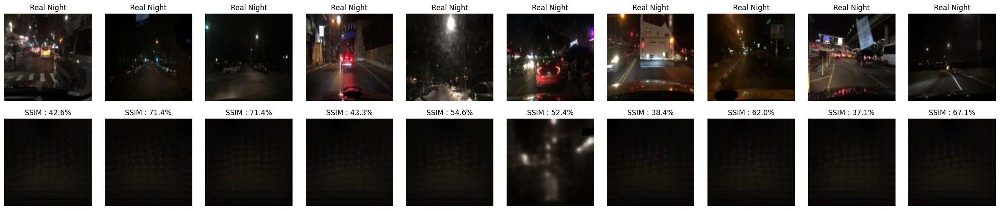

Average SSIM : 54.04


[42.63183772563934,
 71.35702967643738,
 71.41321301460266,
 43.29439699649811,
 54.59223985671997,
 52.427250146865845,
 38.4285569190979,
 62.03303933143616,
 37.100136280059814,
 67.13404059410095]

In [28]:
evaluate_ssim_10_samples(gan.Gd2n, Train, num_samples=10)

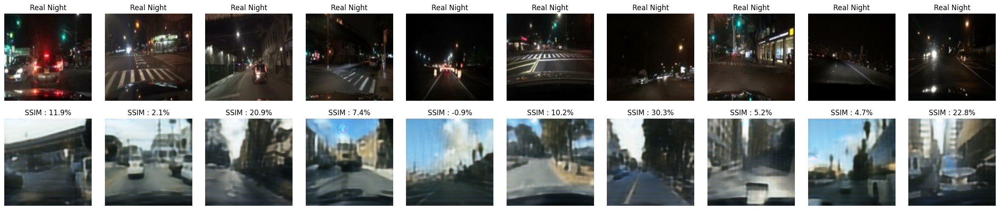

Average SSIM : 11.46


[11.92895844578743,
 2.1385127678513527,
 20.9134504199028,
 7.4006251990795135,
 -0.8605482988059521,
 10.182400792837143,
 30.326899886131287,
 5.1760803908109665,
 4.652566835284233,
 22.769947350025177]

In [29]:
evaluate_ssim_10_samples(gan.Gn2d, Train, num_samples=10)

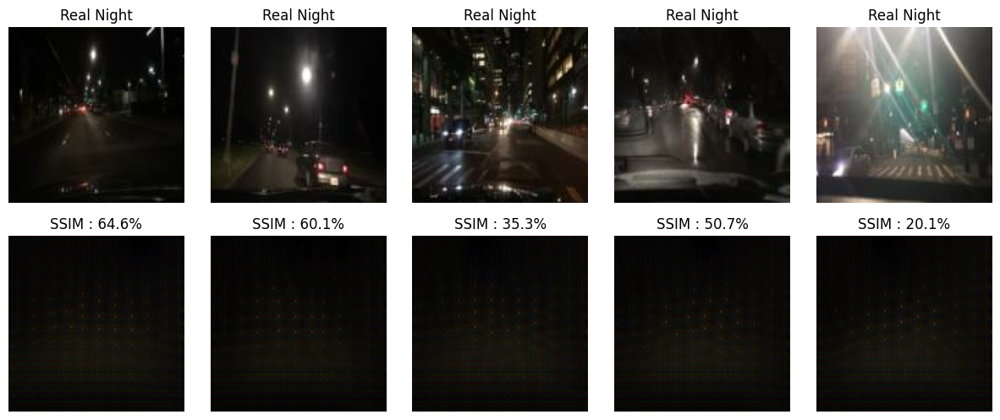

Average SSIM : 46.17


[64.6047830581665,
 60.06767749786377,
 35.342422127723694,
 50.69156289100647,
 20.148737728595734]

In [30]:
evaluate_ssim_10_samples(gan.Gd2n, Train, num_samples=5)

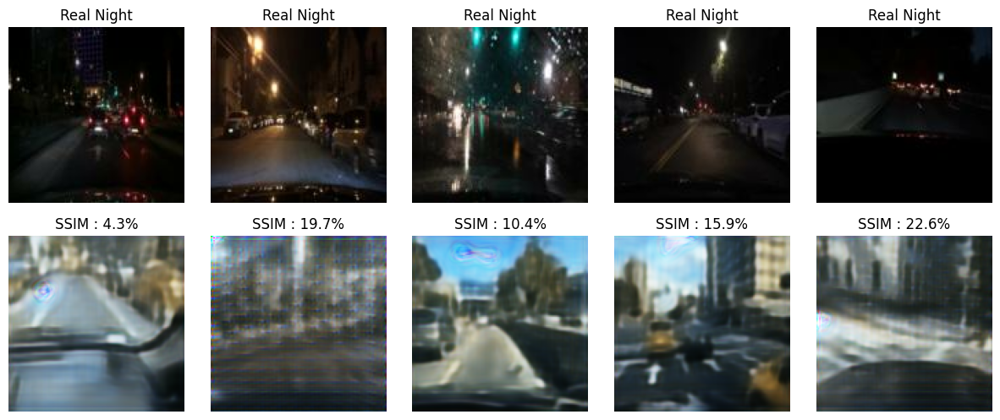

Average SSIM : 14.58


[4.3273527175188065,
 19.744445383548737,
 10.419511049985886,
 15.878771245479584,
 22.5519061088562]

In [31]:
evaluate_ssim_10_samples(gan.Gn2d, Train, num_samples=5)

## FID

In [32]:
def evaluate_fid(generator, dataset, num_samples=10, direction="d2n"):
    inception = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

    fig, axes = plt.subplots(2, num_samples, figsize=(3*num_samples, 6))
    fig.subplots_adjust(wspace=0.15, hspace=0.15)

    real_feats_all = []
    fake_feats_all = []

    def prep(img):
        img = (img + 1.0) * 127.5
        img = tf.image.resize(img, (299, 299))
        return preprocess_input(img)

    def get_feat(img):
        img = tf.expand_dims(img, 0)
        feat = inception.predict(img, verbose=0)
        return feat[0]

    for i, (day_img, night_img) in enumerate(dataset.take(num_samples)):
        
        if direction == "d2n":
            real_img = night_img[0]
            fake_img = generator(day_img, training=False)[0]
            title_real = "Real Night"
        
        elif direction == "n2d":
            real_img = day_img[0]
            fake_img = generator(night_img, training=False)[0]
            title_real = "Real Day"
        
        else:
            raise ValueError("direction must be 'd2n' or 'n2d'")

        real_vis = (real_img + 1) / 2.0
        fake_vis = (fake_img + 1) / 2.0

        real_feat = get_feat(prep(real_img))
        fake_feat = get_feat(prep(fake_img))

        real_feats_all.append(real_feat)
        fake_feats_all.append(fake_feat)

        diff = np.sum((real_feat - fake_feat)**2)

        axes[0, i].imshow(real_vis)
        axes[0, i].set_title(title_real)
        axes[0, i].axis("off")

        axes[1, i].imshow(fake_vis)
        axes[1, i].set_title(f"DIST: {diff:.1f}")
        axes[1, i].axis("off")

    plt.show()

    real_feats_all = np.array(real_feats_all)
    fake_feats_all = np.array(fake_feats_all)

    mu1, sigma1 = real_feats_all.mean(axis=0), np.cov(real_feats_all, rowvar=False)
    mu2, sigma2 = fake_feats_all.mean(axis=0), np.cov(fake_feats_all, rowvar=False)

    eps = 1e-6
    covmean = sqrtm((sigma1 + eps*np.eye(len(sigma1))).dot(sigma2 + eps*np.eye(len(sigma2))))

    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid_score = np.sum((mu1 - mu2)**2) + np.trace(sigma1 + sigma2 - 2 * covmean)

    print(f"\nFID ({direction}) :", round(fid_score, 3))
    return fid_score

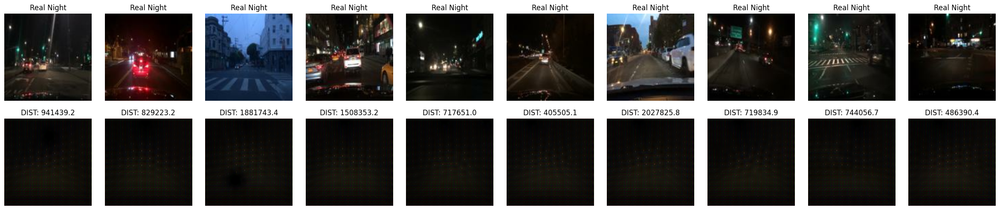


FID (d2n) : 1028579.486


1028579.4863976355

In [33]:
evaluate_fid(gan.Gd2n, Train, num_samples=10, direction="d2n")

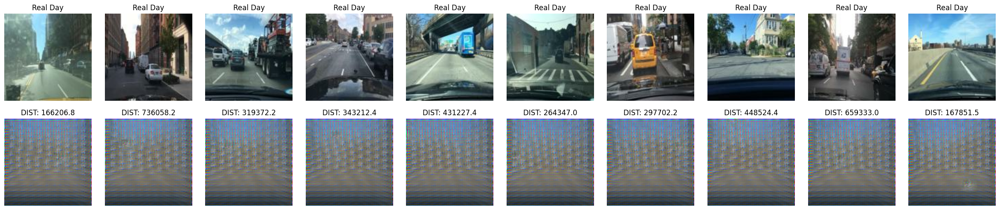


FID (n2d) : 388896.564


388896.5642411397

In [34]:
evaluate_fid(gan.Gn2d, Train, num_samples=10, direction="n2d")

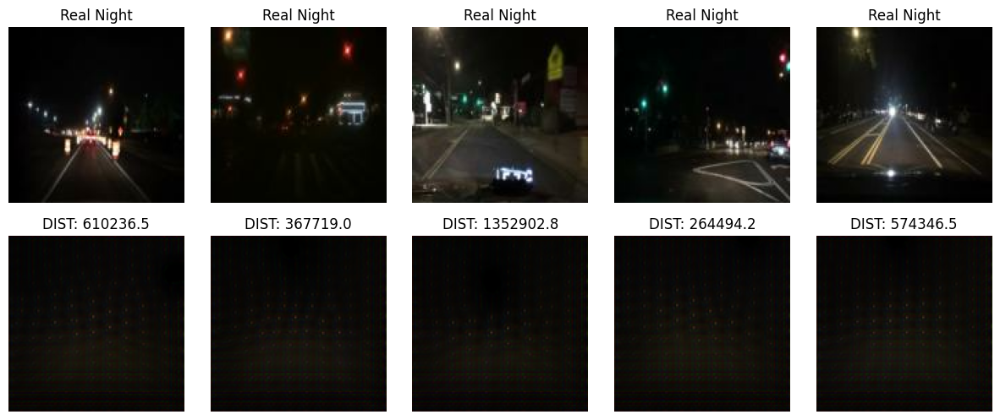


FID (d2n) : 637319.626


637319.6264490592

In [35]:
evaluate_fid(gan.Gd2n, Train, num_samples=5, direction="d2n")

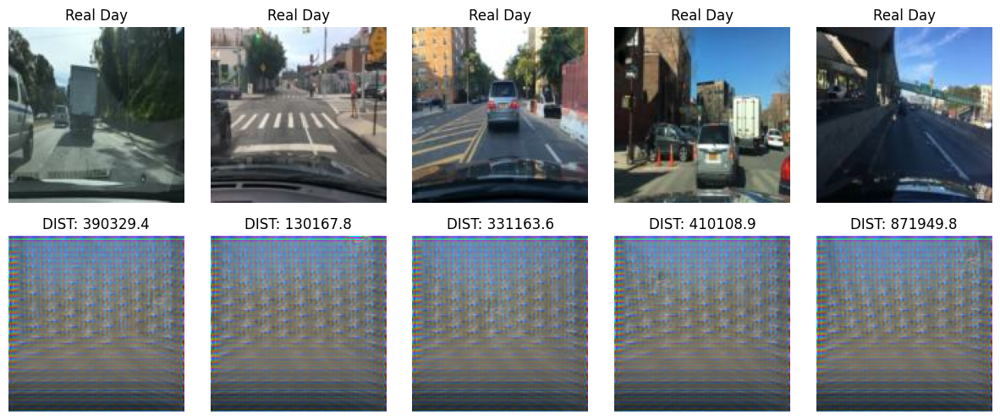


FID (n2d) : 445967.737


445967.7372668882

In [36]:
evaluate_fid(gan.Gn2d, Train, num_samples=5, direction="n2d")

# TESTING MODEL

## LOAD DATASET

In [39]:
day_test     = r"C:\MATTHEW\DATASET\Test\Day"
night_test   = r"C:\MATTHEW\DATASET\Test\Night"

day_test_resize   = r"C:\MATTHEW\DATASET\Test\Resized 256 x 256\Day"
night_test_resize = r"C:\MATTHEW\DATASET\Test\Resized 256 x 256\Night"

## PREPROCESS

In [40]:
def load_image(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (256, 256))   
    img = (tf.cast(img, tf.float32) / 127.5) - 1.0
    return img

## DATASET BUILDER

In [41]:
def make_dataset(folder, batch_size=1, shuffle=False):
    pattern = os.path.join(folder, "*")
    ds = tf.data.Dataset.list_files(pattern, shuffle=shuffle)
    ds = ds.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size)
    return ds

## IMAGE RESIZE

In [85]:
def resize_images(input_dir, output_dir, size=(256, 256)):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for f in os.listdir(input_dir):
        if f.lower().endswith(('.jpg', '.jpeg', '.png')):
            input_path = os.path.join(input_dir, f)
            output_path = os.path.join(output_dir, f)
            try:
                img = Image.open(input_path)
                img = ImageOps.exif_transpose(img)
                img = img.convert("RGB")
                img = img.resize(size)
                img.save(output_path)
            except Exception as e:
                print(f"Gagal resize {f}: {e}")

resize_images(day_test, day_test_resize)
resize_images(night_test, night_test_resize)

## SHOW IMAGE

In [42]:
def show_10_samples(folder_path):
    valid_ext = (".jpg", ".jpeg", ".png")
    files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_ext)]

    if not files:
        print("No image files :", folder_path)
        return

    sample_files = random.sample(files, min(10, len(files)))

    rows, cols = 2, 5
    plt.figure(figsize=(22, 9))

    for i, filename in enumerate(sample_files, start=1):
        img_path = os.path.join(folder_path, filename)
        img = Image.open(img_path)
        img = ImageOps.exif_transpose(img).convert("RGB")
        plt.subplot(rows, cols, i)
        plt.imshow(img)
        plt.title(filename, fontsize=10)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

### ORIGINAL IMAGE 

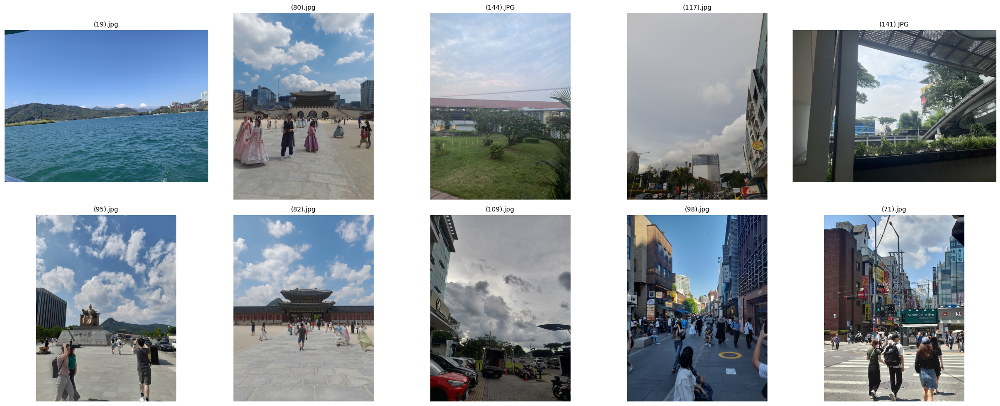

In [43]:
show_10_samples(day_test)

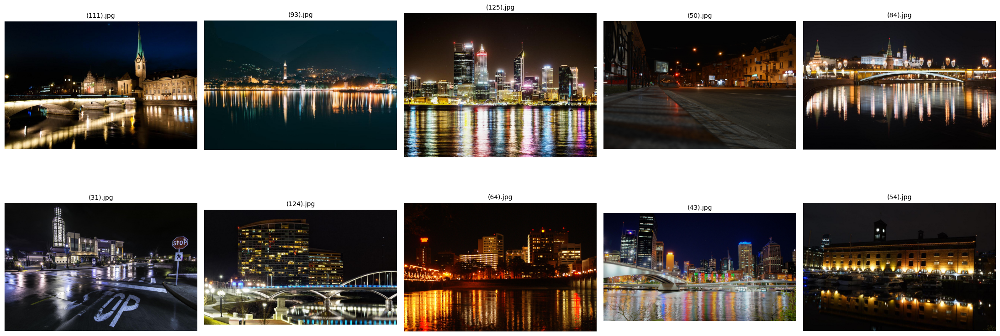

In [44]:
show_10_samples(night_test)

### RESIZE IMAGE (256x256)

In [45]:
show_images(day_test_resize, title="Day - Resized 256x256")

NameError: name 'show_images' is not defined

In [ ]:
show_images(night_test_resize, title="Night - Resized 256x256")

## SHOW OUTPUT 

In [ ]:
day_test_ds   = make_dataset(day_test_resize)
night_test_ds = make_dataset(night_test_resize)

def visualize_generator_outputs(generator, dataset, num_samples=8, title="Preview"):
    fig, axes = plt.subplots(2, num_samples, figsize=(3*num_samples, 6))
    fig.suptitle(title, fontsize=16)
    fig.subplots_adjust(wspace=0.15, hspace=0.15)

    for i, real_image in enumerate(dataset.take(num_samples)):
        fake_image = generator(real_image, training=False)

        real_vis = ((real_image[0] + 1) / 2.0).numpy()
        fake_vis = ((fake_image[0] + 1) / 2.0).numpy()

        axes[0, i].imshow(real_vis)
        axes[0, i].set_title("Real", fontsize=12)
        axes[0, i].axis("off")

        axes[1, i].imshow(fake_vis)
        axes[1, i].set_title("Fake", fontsize=12)
        axes[1, i].axis("off")

    plt.show()

In [ ]:
visualize_generator_outputs(gan.Gn2d, night_test_ds, num_samples=10, title="Night → Day")

In [ ]:
visualize_generator_outputs(gan.Gd2n, day_test_ds, num_samples=10, title="Day → Night")

In [ ]:
visualize_generator_outputs(gan.Gn2d, night_test_ds, num_samples=5, title="Night → Day")

In [ ]:
visualize_generator_outputs(gan.Gd2n, day_test_ds, num_samples=5, title="Day → Night")